# (sFigure18)-GeneTrajectory Deconvolves the Intestinal Metaplasia Processes in H. pylori Infection.

In [1]:
import scanpy as sc

from gene_trajectory.add_gene_bin_score import add_gene_bin_score
from gene_trajectory.coarse_grain import select_top_genes, coarse_grain_adata
from gene_trajectory.extract_gene_trajectory import get_gene_embedding, extract_gene_trajectory
from gene_trajectory.get_graph_distance import get_graph_distance
from gene_trajectory.gene_distance_shared import cal_ot_mat
from gene_trajectory.run_dm import run_dm
from gene_trajectory.plot.gene_trajectory_plots import plot_gene_trajectory_3d, plot_gene_trajectory_umap
from gene_trajectory.util.download_file import download_file_if_missing

In [2]:
import omicverse as ov


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.5.8, Tutorials: https://omicverse.readthedocs.io/


In [3]:
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [4]:
adata = sc.read_h5ad('Gastric/Data/Epi_anno.h5ad')
adata_raw = sc.read_h5ad('Gastric/Data/Gastric_Origin.h5ad')
adata, adata_raw

(AnnData object with n_obs × n_vars = 26265 × 2000
     obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person', 'Epi_celltype'
     var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
     uns: 'Group_number_colors', 'Person_colors', 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_Epi_celltype', 'dendrogram_Group_number', 'dendrogram_leiden', 'dendrogram_major_celltype', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'major_celltype_colors', 'neighbors', 'paga', 'pca', 'umap'
     obsm: 'X_pca', 'X_scVI', 'X_umap'
     varm: 'PCs'
     layers: 'counts'
     obsp: 'connectivities', 'distances',
 AnnData object with n_obs × n_vars = 63398 × 32559
     obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts'

In [5]:
adata_raw = adata_raw[adata.obs.index]
adata_raw.obs = adata.obs
adata_raw.uns = adata.uns
adata_raw.obsm = adata.obsm
adata_raw.uns['Epi_celltype_colors'] = [ov.pl.blue_color[2],ov.pl.blue_color[3],ov.pl.red_color[4],ov.pl.blue_color[5],
                                  ov.pl.red_color[0],ov.pl.red_color[2],ov.pl.red_color[1]]
adata_raw

AnnData object with n_obs × n_vars = 26265 × 32559
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person', 'Epi_celltype'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Group_number_colors', 'Person_colors', 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_Epi_celltype', 'dendrogram_Group_number', 'dendrogram_leiden', 'dendrogram_major_celltype', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'major_celltype_colors', 'neighbors', 'paga', 'pca', 'umap', 'Epi_celltype_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [6]:
CD4 = adata_raw[:,['CD3D','CD3E']].to_df()
CD4 = CD4[CD4.loc[:,'CD3D']==0]
CD4 = CD4[CD4.loc[:,'CD3E']==0]
adata_raw = adata_raw[CD4.index.tolist(),:]
adata_raw

View of AnnData object with n_obs × n_vars = 25500 × 32559
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person', 'Epi_celltype'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'Group_number_colors', 'Person_colors', 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'dendrogram_Epi_celltype', 'dendrogram_Group_number', 'dendrogram_leiden', 'dendrogram_major_celltype', 'hvg', 'leiden', 'leiden_colors', 'leiden_sizes', 'log1p', 'major_celltype_colors', 'neighbors', 'paga', 'pca', 'umap', 'Epi_celltype_colors'
    obsm: 'X_pca', 'X_scVI', 'X_umap'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

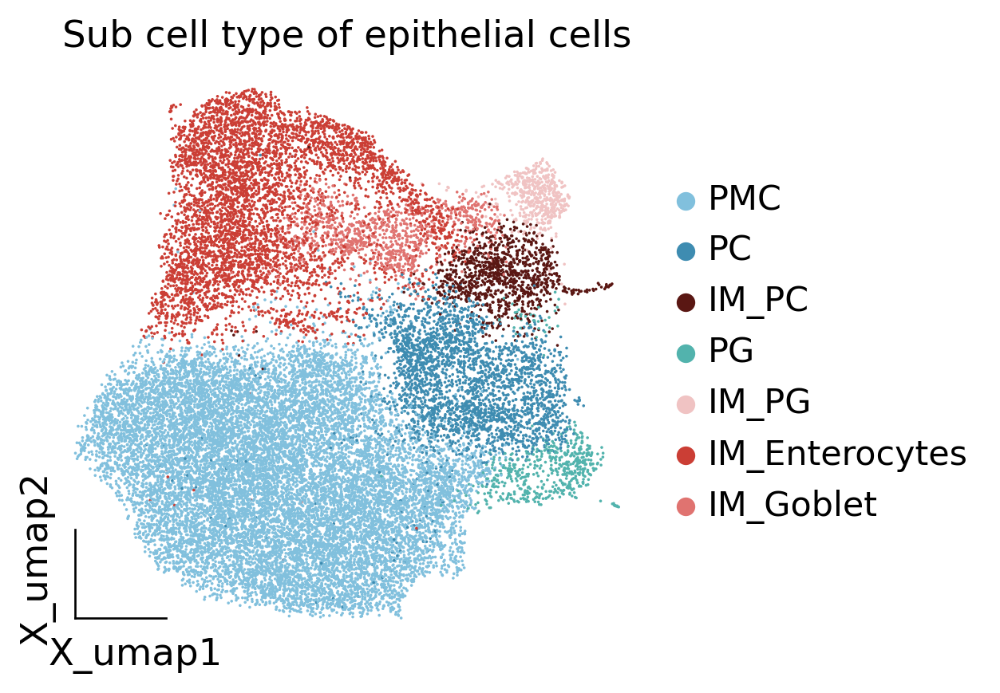

In [7]:
import matplotlib.pyplot as plt
fig,ax=plt.subplots( figsize = (4,4))
ax = ov.utils.embedding(adata_raw,
                basis='X_umap',
                color=['Epi_celltype'],
                title='Sub cell type of epithelial cells',
                frameon='small',
                show=False,
                ax=ax)
#ax.set_title('Types of tissues')

plt.savefig('Gastric/Figure/sFigure18/sFigure18_A.png', dpi=300,bbox_inches = 'tight')

In [8]:
sc.pp.filter_genes(adata_raw, min_cells=20)
adata = adata_raw

In [9]:
genes = select_top_genes(adata_raw, layer='counts', n_variable_genes=1000)
genes

array(['JCHAIN', 'LTF', 'MUC6', 'BEST4', 'REG3A', 'PGC', 'IGHA1',
       'GUCA2A', 'SPINK4', 'IGKC', 'ITLN1', 'BPIFB1', 'CLCA1', 'GUCA2B',
       'MUC2', 'ZG16', 'KRT17', 'IGKV3-20', 'CCL20', 'AC020656.1',
       'REG1B', 'CXCL8', 'CXCL1', 'OLFM4', 'IGHV5-51', 'PRR4', 'CA1',
       'IGHV4-39', 'CXCL2', 'TFF3', 'REG1A', 'AQP5', 'MT1H', 'CXCL5',
       'HBB', 'PI3', 'MSMB', 'C16orf89', 'HSPA6', 'IGKV1D-33', 'GSTA2',
       'MZB1', 'IGHA2', 'IGKV1-39', 'IGLC2', 'IGKV3-15', 'IGHG1',
       'HIST1H1B', 'ICAM1', 'VIM', 'WFDC2', 'UBE2C', 'RGS5', 'CCL4',
       'IGKV1D-39', 'CCNB1', 'SERPINA1', 'AP006216.3', 'RF00100-4',
       'TNFRSF6B', 'APOC3', 'LCN2', 'CXCL10', 'APOA4', 'UBD', 'FAM25A',
       'IGHV3-23', 'EDN1', 'TCN1', 'IGKV1-5', 'MMP1', 'THBS1', 'MT1M',
       'APOA1', 'PLA2G2A', 'RBP2', 'CDC20', 'GP2', 'CXCL3', 'SPIB',
       'MUC5B', 'LINC02688', 'CD69', 'IGLV2-11', 'CENPF', 'MIA', 'PTTG1',
       'MKI67', 'KLK7', 'CCL25', 'CD79A', 'SAA1', 'GSTA1', 'CXCR4',
       'TOP2A', 'IGLV3-1',

In [10]:
run_dm(adata_raw,reduction='X_scVI',n_components=10)

In [11]:
cell_graph_dist = get_graph_distance(adata_raw, k=10)
gene_expression_updated, graph_dist_updated = coarse_grain_adata(adata_raw, graph_dist=cell_graph_dist, features=genes, n=500)
gene_dist_mat = cal_ot_mat(gene_expr=gene_expression_updated, 
                           ot_cost=graph_dist_updated, 
                           show_progress_bar=True)

100%|██████████| 270480/270480 [00:09<00:00, 28046.23it/s] 


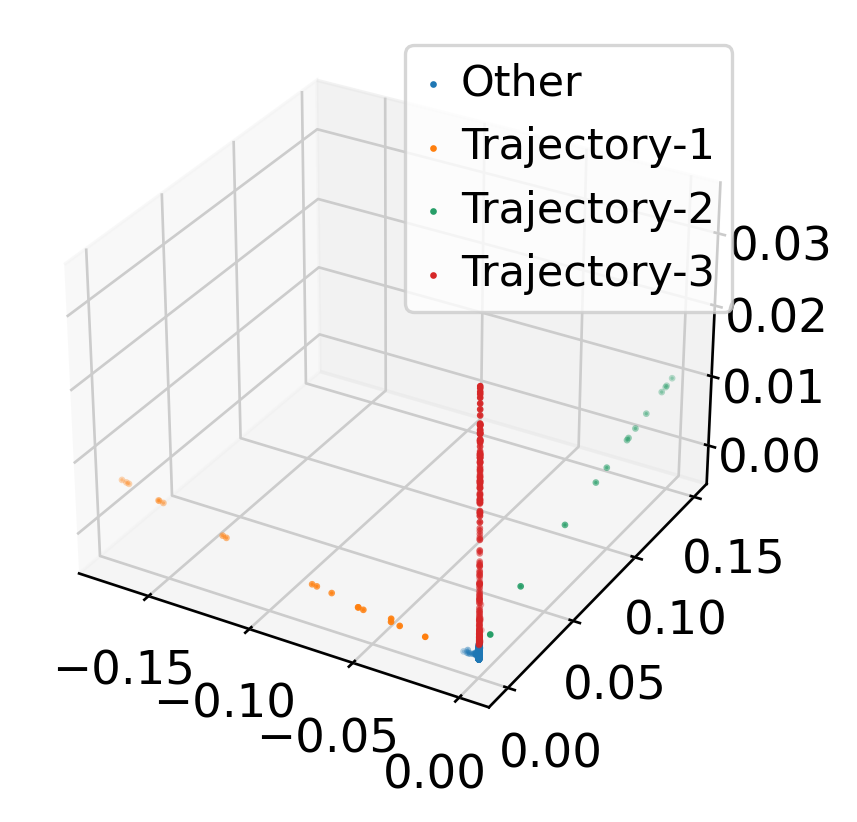

In [12]:
import matplotlib.pyplot as plt

gene_embedding, _ = get_gene_embedding(gene_dist_mat, k = 5)
gene_trajectory = extract_gene_trajectory(gene_embedding, gene_dist_mat, t_list = [4, 8, 7], gene_names=genes, k=5)
plot_gene_trajectory_3d(gene_trajectory)
plt.savefig('Gastric/Figure/sFigure18/sFigure18_B.png', dpi=300,bbox_inches = 'tight')

In [13]:
# Normalizing to median total counts
sc.pp.normalize_total(adata_raw)
# Logarithmize the data
sc.pp.log1p(adata_raw)
adata_raw.layers['lognorm'] = adata_raw.X.copy()

In [14]:
add_gene_bin_score(adata_raw, gene_trajectory=gene_trajectory, n_bins=5, trajectories=3, layer='lognorm')

In [15]:
adata_raw

AnnData object with n_obs × n_vars = 25500 × 19957
    obs: 'Group_number', 'Sample', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', '_scvi_batch', '_scvi_labels', 'leiden', 'major_celltype', 'Person', 'Epi_celltype', 'log1p_n_genes_by_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'Trajectory1_genes1', 'Trajectory1_genes2', 'Trajectory1_genes3', 'Trajectory1_genes4', 'Trajectory1_genes5', 'Trajectory2_genes1', 'Trajectory2_genes2', 'Trajectory2_genes3', 'Trajectory2_genes4', 'Trajectory2_genes5', 'Trajectory3_genes1', 'Trajectory3_genes2', 'Trajectory3_genes3', 'Trajectory3_genes4', 'Trajectory3_genes5'
    var: 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_mean_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'Group_

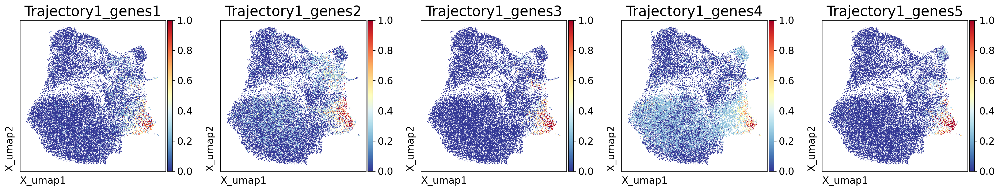

In [16]:
import matplotlib.pyplot as plt
import matplotlib as mpl
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), sharex=True, sharey=True)
all_genes = ['Trajectory1_genes1', 'Trajectory1_genes2', 'Trajectory1_genes3', 'Trajectory1_genes4', 'Trajectory1_genes5']

for i, row_axes in enumerate(axes):
    axes = ov.utils.embedding(adata_raw,
                               basis='X_umap',
                               color=all_genes[i],
                               title=all_genes[i],
                               frameon=None,
                               show=False,
                               legend_loc=False,
                               #colorbar_loc=None,
                               color_map = 'RdYlBu_r',
                               ax=row_axes)
    axes.set_title(all_genes[i],fontdict={'size':20})


plt.tight_layout()

plt.savefig('Gastric/Figure/sFigure18/sFigure18_C.png', dpi=300)
plt.show()


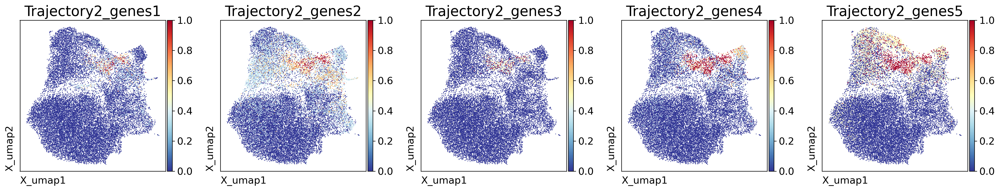

In [17]:
import matplotlib.pyplot as plt
import matplotlib as mpl
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), sharex=True, sharey=True)
all_genes = ['Trajectory2_genes1', 'Trajectory2_genes2', 'Trajectory2_genes3', 'Trajectory2_genes4', 'Trajectory2_genes5',]

for i, row_axes in enumerate(axes):
    axes = ov.utils.embedding(adata_raw,
                               basis='X_umap',
                               color=all_genes[i],
                               title=all_genes[i],
                               frameon=None,
                               show=False,
                               legend_loc=False,
                               #colorbar_loc=None,
                               color_map = 'RdYlBu_r',
                               ax=row_axes)
    axes.set_title(all_genes[i],fontdict={'size':20})


plt.tight_layout()

plt.savefig('Gastric/Figure/sFigure18/sFigure18_D.png', dpi=300)
plt.show()


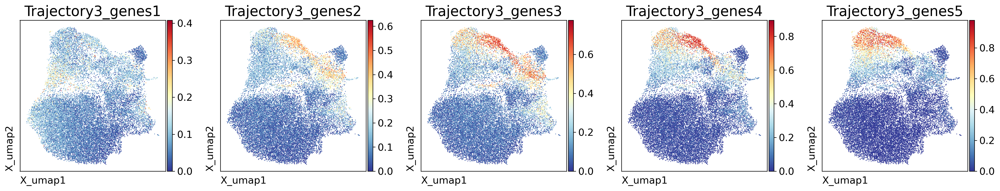

In [18]:
import matplotlib.pyplot as plt
import matplotlib as mpl
fig, axes = plt.subplots(nrows=1, ncols=5, figsize=(20, 4), sharex=True, sharey=True)
all_genes = ['Trajectory3_genes1', 'Trajectory3_genes2', 'Trajectory3_genes3', 'Trajectory3_genes4', 'Trajectory3_genes5',]

for i, row_axes in enumerate(axes):
    axes = ov.utils.embedding(adata_raw,
                               basis='X_umap',
                               color=all_genes[i],
                               title=all_genes[i],
                               frameon=None,
                               show=False,
                               legend_loc=False,
                               #colorbar_loc=None,
                               color_map = 'RdYlBu_r',
                               ax=row_axes)
    axes.set_title(all_genes[i],fontdict={'size':20})


plt.tight_layout()

plt.savefig('Gastric/Figure/sFigure18/sFigure18_E.png', dpi=300)
plt.show()


In [20]:
import pandas as pd
import numpy as np

n_bins=5
trajectories=3
reverse = None

trajectory_name = 'Pseudoorder-3'
gene_trajectory_reordered = gene_trajectory.sort_values(trajectory_name)
genes_used = gene_trajectory_reordered[gene_trajectory_reordered[trajectory_name] > 0].index.values
step = len(genes_used) / n_bins
adata_subset = {}
for i in range(n_bins):
    start = int(np.ceil(i * step))
    end = min(int(np.ceil((i + 1) * step)), len(genes_used))
    adata_subset[i] = genes_used[start:end]



df_list = []
for i in range(n_bins):
    pathway_dict=ov.utils.geneset_prepare('GBM/Reference/genesets/GO_Biological_Process_2021.txt',organism='Human')
    enr=ov.bulk.geneset_enrichment(gene_list=adata_subset[i].tolist(),
                                pathways_dict=pathway_dict,
                                pvalue_type='auto',
                                organism='Human')
    enr['-log10(Adjusted P-value)'] = -np.log10(enr['Adjusted P-value'])
    enr = enr.sort_values('-log10(Adjusted P-value)', ascending=False)
    df_list.append(enr)
cutoff=0.05
cluster_list = ['Trajectory3_genes1','Trajectory3_genes2','Trajectory3_genes3','Trajectory3_genes4','Trajectory3_genes5']


columns = ['Cluster', 'Gene_set', 'Term', 'Overlap', 'Odds Ratio','P-value', 'Adjusted P-value', 'Genes']
df = pd.DataFrame(columns = columns)
for cluster_ind, df_ in zip(cluster_list, df_list):
    df_ = df_[df_['Adjusted P-value'] <= cutoff]
    df_ = df_.assign(Cluster = cluster_ind)
    if (df_.shape[0] > 0):
        df = pd.concat([df, df_[columns]], sort=False)
        df_tmp = df_.loc[:, ['Term', 'Adjusted P-value']][:min(10, df_.shape[0])]
        df_tmp['Term'] = [x.split('(',1)[0] for x in df_tmp['Term']]
        df_tmp['-log_adj_p'] = - np.log10(df_tmp['Adjusted P-value'])
        df_tmp = df_tmp.sort_values(by='-log_adj_p', ascending=True)

enrich_res=df[df['Adjusted P-value']<cutoff]
enrich_res['logp']=-np.log(enrich_res['Adjusted P-value'])


enrich_res['logc']=np.log(enrich_res['Odds Ratio'])
enrich_res['num']=[int(i.split('/')[0]) for i in enrich_res['Overlap']]
enrich_res['fraction']=[int(i.split('/')[0])/int(i.split('/')[1]) for i in enrich_res['Overlap']]

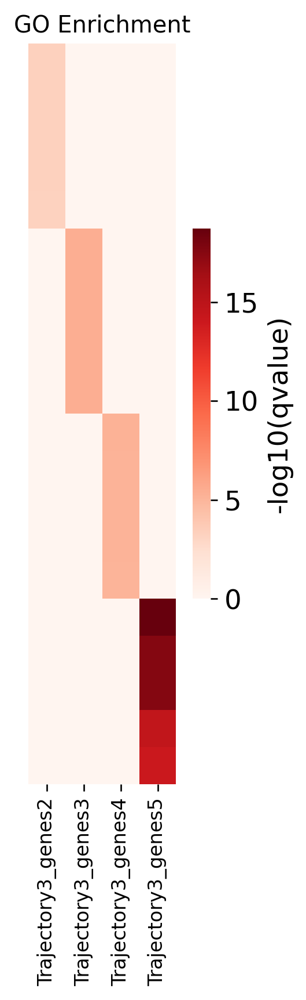

In [21]:
ax=ov.single.pathway_enrichment_plot(enrich_res,plot_title='GO Enrichment',cmap='Reds',
                                         xticklabels=True,cbar=True,square=True,figsize=(3,7),
                                         yticklabels=False,cbar_kws={'label': '-log10(qvalue)','shrink': 0.5,})
plt.savefig('Gastric/Figure/sFigure18/sFigure18_F_cbar.png', dpi=300,bbox_inches = 'tight')


In [22]:
def insert_newlines(s, n=55):
    if len(s) <= n:
        return s
    parts = s.split(' ')
    new_s = parts[0]
    for part in parts[1:]:
        if len(new_s) - new_s.rfind('\n') + len(part) + 1 > n:
            new_s += '\n' + part
        else:
            new_s += ' ' + part
    return new_s


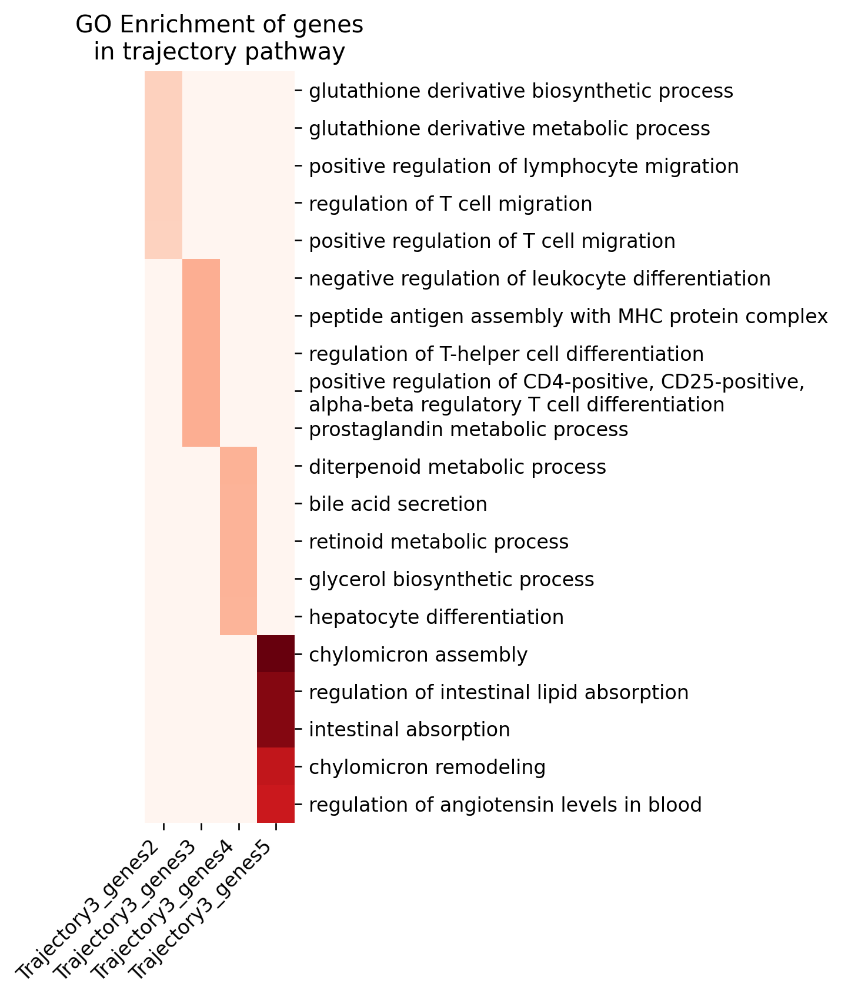

In [23]:
enrich_res['Term'] = enrich_res['Term'].str.replace('\(GO:\d+\)', '', regex=True)
enrich_res['Term'] = enrich_res['Term'].apply(insert_newlines)
ax=ov.single.pathway_enrichment_plot(enrich_res,plot_title='GO Enrichment of genes\nin trajectory pathway',cmap='Reds',
                                         xticklabels=True,cbar=False,square=True,figsize=(3,7),
                                         yticklabels=True,cbar_kws={'label': '-log10(qvalue)','shrink': 0.5,})
labels = [item.get_text() for item in ax.get_xticklabels()]
#ax.set_title('Positive infected tissues')
ax.set_xticklabels(labels, rotation=45, ha='right')
plt.savefig('Gastric/Figure/sFigure18/sFigure18_F.png', dpi=300,bbox_inches = 'tight')


In [24]:
adata_subset

{0: array(['PLA2G2F', 'DHRS9', 'IGLV3-25', 'IDO1', 'GPX3', 'IGKV1D-39', 'PI3',
        'LAMC2', 'BEST4', 'IGHV1-69D', 'DUOXA2', 'IGHV4-59', 'ADGRG4',
        'CD79A', 'IGHM', 'TNFRSF6B', 'SERPINB7', 'IGHV1-18', 'SRGN',
        'CXCL11', 'MUC4', 'NMUR2', 'IGKV2-30', 'SCNN1D', 'KRT17',
        'IGKV1-9', 'CCL4', 'PTPRCAP', 'IGKV1-12', 'FAM25A', 'CST6',
        'IGLV3-19', 'MZB1', 'GUCA2A', 'IGKV1-39', 'JSRP1', 'DEFB4A',
        'ZBP1', 'IGHA1', 'CD69', 'JCHAIN', 'IGKV3-20', 'GPRC5A',
        'IGLV1-44', 'IGHV2-5', 'IGLV3-21', 'MT2A', 'IGKC', 'TNFAIP2'],
       dtype=object),
 1: array(['IGHV3-7', 'IGHV3-74', 'HMGCS2', 'GUCA2B', 'IGKV3D-20', 'IGLV1-47',
        'IGLV2-23', 'IGLV7-46', 'EREG', 'IGKV3-11', 'IGLC2', 'IGKV3-15',
        'CEACAM6', 'IGKV4-1', 'IGHV3-30', 'IGLV1-51', 'IGHV4-34', 'FGFBP1',
        'IGHV3-23', 'IGHA2', 'COL6A1', 'IGFBP3', 'IGHV4-39', 'REG4',
        'PRELID1', 'ETHE1', 'HADH', 'CXCL10', 'IGHV3-11', 'ATP5MC3',
        'MTCH2', 'IGLV4-69', 'PYCARD', 'RBP4', 'IGKV1-

In [ ]:
enrich_res